# Setup

In [1]:
from pathlib import Path
import ast
import pandas as pd

from thesis_assyrian_relief.utils.inspection import (
    plot_relief_views,
    plot_query_and_retrieved_reliefs,
)

In [2]:
IMAGE_LEVEL_CSV = "../data/splits/image_level_dataset.csv"
IMAGE_ROOT = "/mnt/c/Users/chend/Desktop/My_Files/Thesis/Dataset/dataset"
FAILURES_CSV = "../outputs/retrieval/test_failures.csv"

df_failures = pd.read_csv(FAILURES_CSV)
print(df_failures.shape)
df_failures.head()

(7, 8)


,query_relief_id,query_authority,topk_reliefs,topk_labels,topk_sims,top1_correct,top3_hit,top5_hit
0,AO 19854,OTHER,"['BM 124918', 'BM 124551', 'BM 118905', 'BM 12...","['Ashurbanipal', 'Ashurnasirpal II', 'OTHER', ...","[0.9904791116714478, 0.988007128238678, 0.9864...",False,True,True
1,BM 118914,Ashurbanipal,"['BM 98061', 'BM 124556', 'BM 118918', 'BM 124...","['Ashurnasirpal II', 'Ashurnasirpal II', 'Ashu...","[0.9891626834869385, 0.9880930781364441, 0.985...",False,True,True
2,BM 124773,OTHER,"['BM 136774', 'BM 124863', 'BM 124789', 'BM 11...","['Ashurbanipal', 'Ashurbanipal', 'OTHER', 'OTH...","[0.983705997467041, 0.9773921966552734, 0.9757...",False,True,True
3,BM 124901,OTHER,"['BM 124918', 'BM 124551', 'BM 124538', 'BM 11...","['Ashurbanipal', 'Ashurnasirpal II', 'Ashurnas...","[0.9940874576568604, 0.9899516105651855, 0.989...",False,False,True
4,BM 124911,OTHER,"['BM 124548', 'BM 124554', 'BM 124937', 'BM 12...","['Ashurnasirpal II', 'Ashurnasirpal II', 'Ashu...","[0.988808810710907, 0.9887193441390991, 0.9881...",False,False,True


# show the failure table compactly

In [3]:
cols = [
    "query_relief_id",
    "query_authority",
    "topk_reliefs",
    "topk_labels",
    "topk_sims",
    "top1_correct",
    "top3_hit",
    "top5_hit",
]

df_failures[cols]

,query_relief_id,query_authority,topk_reliefs,topk_labels,topk_sims,top1_correct,top3_hit,top5_hit
0,AO 19854,OTHER,"['BM 124918', 'BM 124551', 'BM 118905', 'BM 12...","['Ashurbanipal', 'Ashurnasirpal II', 'OTHER', ...","[0.9904791116714478, 0.988007128238678, 0.9864...",False,True,True
1,BM 118914,Ashurbanipal,"['BM 98061', 'BM 124556', 'BM 118918', 'BM 124...","['Ashurnasirpal II', 'Ashurnasirpal II', 'Ashu...","[0.9891626834869385, 0.9880930781364441, 0.985...",False,True,True
2,BM 124773,OTHER,"['BM 136774', 'BM 124863', 'BM 124789', 'BM 11...","['Ashurbanipal', 'Ashurbanipal', 'OTHER', 'OTH...","[0.983705997467041, 0.9773921966552734, 0.9757...",False,True,True
3,BM 124901,OTHER,"['BM 124918', 'BM 124551', 'BM 124538', 'BM 11...","['Ashurbanipal', 'Ashurnasirpal II', 'Ashurnas...","[0.9940874576568604, 0.9899516105651855, 0.989...",False,False,True
4,BM 124911,OTHER,"['BM 124548', 'BM 124554', 'BM 124937', 'BM 12...","['Ashurnasirpal II', 'Ashurnasirpal II', 'Ashu...","[0.988808810710907, 0.9887193441390991, 0.9881...",False,False,True
5,BM 124919,Ashurbanipal,"['BM 124789', 'BM 124793', 'BM 124801', 'BM 12...","['OTHER', 'Ashurbanipal', 'Ashurbanipal', 'Ash...","[0.9928906559944153, 0.9901620745658875, 0.989...",False,True,True
6,BM 124933,Ashurbanipal,"['BM 124551', 'BM 118912', 'BM 124920', 'BM 12...","['Ashurnasirpal II', 'Ashurbanipal', 'Ashurban...","[0.9910910725593567, 0.9907942414283752, 0.989...",False,True,True


# inspect one failure by row index

In [4]:
row_idx = 1  # change this manually

row = df_failures.iloc[row_idx]

query_relief_id = row["query_relief_id"]
query_authority = row["query_authority"]

topk_reliefs = ast.literal_eval(row["topk_reliefs"]) if isinstance(row["topk_reliefs"], str) else row["topk_reliefs"]
topk_labels = ast.literal_eval(row["topk_labels"]) if isinstance(row["topk_labels"], str) else row["topk_labels"]
topk_sims = ast.literal_eval(row["topk_sims"]) if isinstance(row["topk_sims"], str) else row["topk_sims"]

print("Query relief:", query_relief_id)
print("Query authority:", query_authority)
print()

for i, (rid, lab, sim) in enumerate(zip(topk_reliefs, topk_labels, topk_sims), start=1):
    print(f"Rank {i}: {rid} | {lab} | sim={sim:.4f}")

Query relief: BM 118914
Query authority: Ashurbanipal

Rank 1: BM 98061 | Ashurnasirpal II | sim=0.9892
Rank 2: BM 124556 | Ashurnasirpal II | sim=0.9881
Rank 3: BM 118918 | Ashurbanipal | sim=0.9856
Rank 4: BM 124585 | Ashurnasirpal II | sim=0.9855
Rank 5: BM 124538 | Ashurnasirpal II | sim=0.9833


# show query + top retrieved reliefs

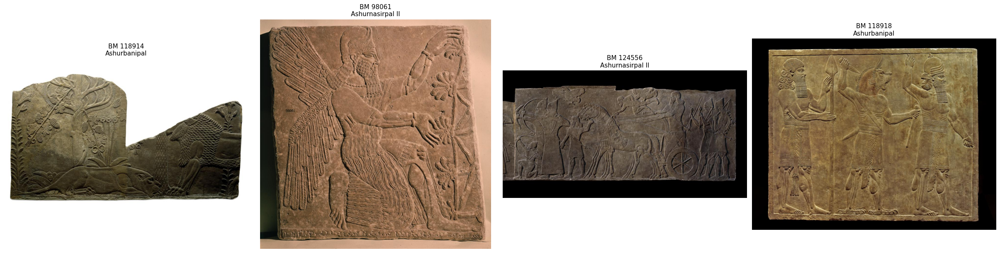

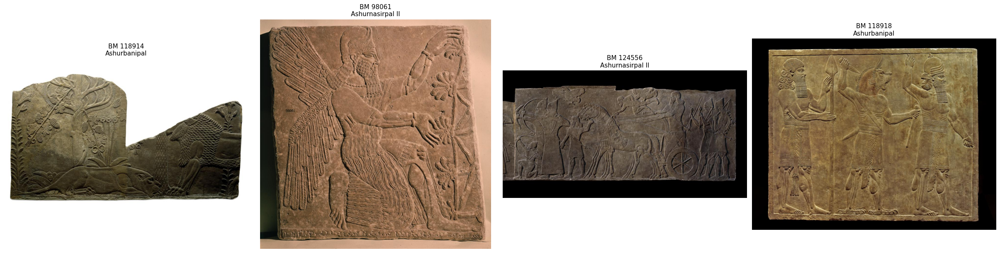

In [ ]:
plot_query_and_retrieved_reliefs(
    image_level_csv=IMAGE_LEVEL_CSV,
    image_root=IMAGE_ROOT,
    query_relief_id=query_relief_id,
    retrieved_relief_ids=topk_reliefs[:3],   # first 3 retrieved neighbors
)

# show all views of the query relief

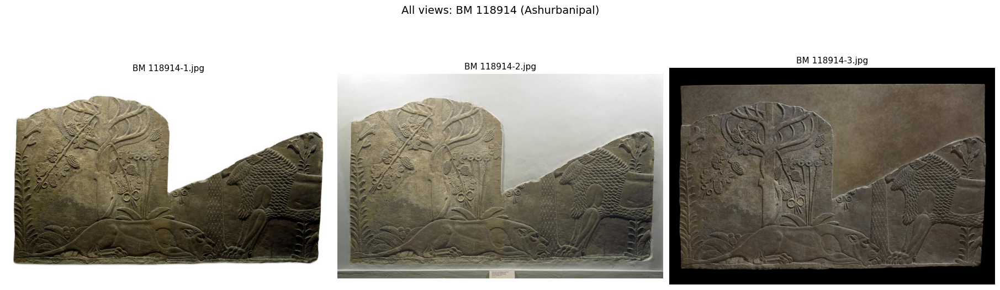

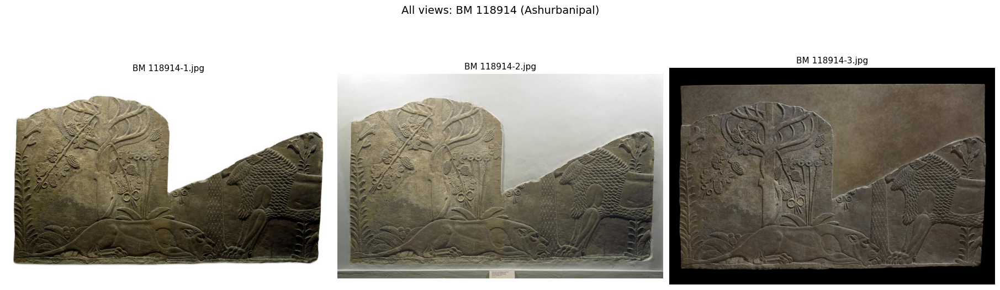

In [8]:
plot_relief_views(
    image_level_csv=IMAGE_LEVEL_CSV,
    image_root=IMAGE_ROOT,
    relief_id=query_relief_id,
    title=f"All views: {query_relief_id} ({query_authority})",
    show=True
)

# show all views of the top-1 retrieved relief

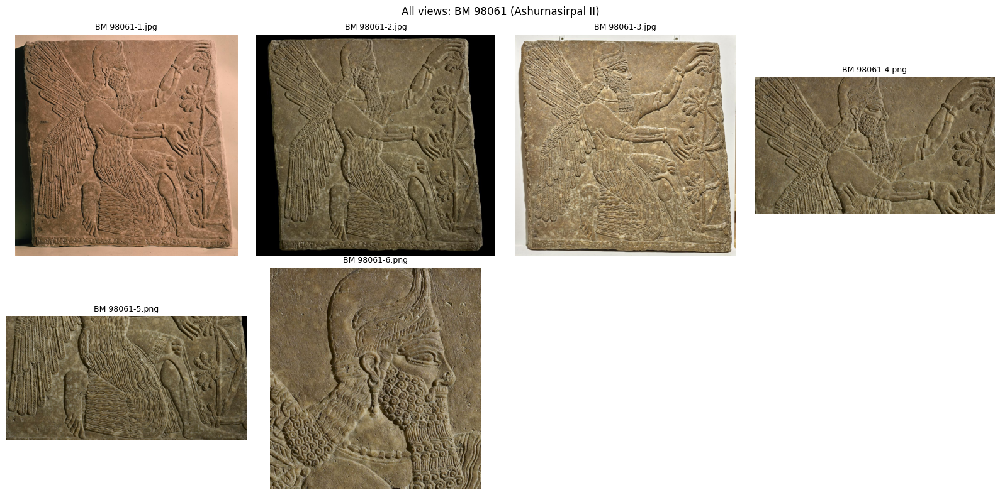

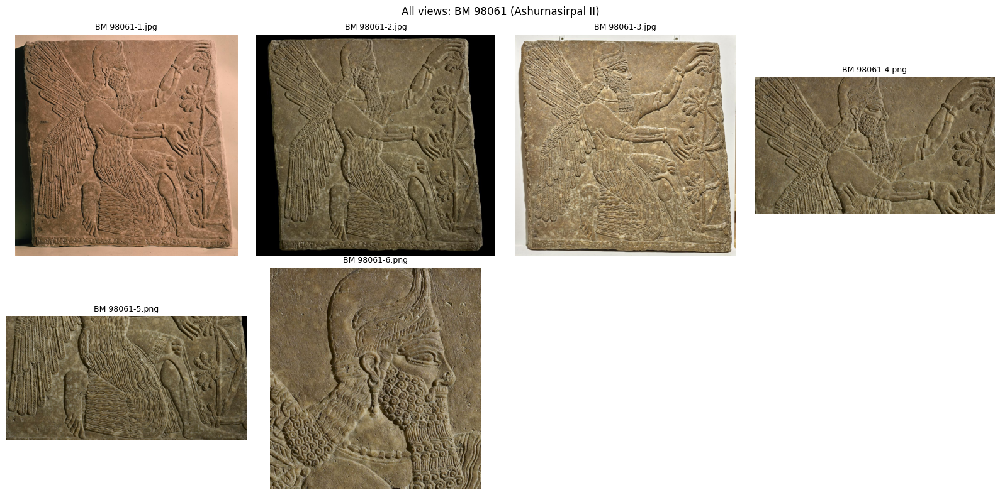

In [16]:
top1_relief_id = topk_reliefs[0]
top1_authority = topk_labels[0]

plot_relief_views(
    image_level_csv=IMAGE_LEVEL_CSV,
    image_root=IMAGE_ROOT,
    relief_id=top1_relief_id,
    title=f"All views: {top1_relief_id} ({top1_authority})",
)